In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Collecting youtube Data

Data source: https://www.kaggle.com/datasets/datasnaek/youtube-new

In [2]:
import os
filepath = r"Enter the path Here"

In [3]:
files=os.listdir(filepath)

In [4]:
files

['CAvideos.csv',
 'CA_category_id.json',
 'DEvideos.csv',
 'DE_category_id.json',
 'FRvideos.csv',
 'FR_category_id.json',
 'GBvideos.csv',
 'GB_category_id.json',
 'INvideos.csv',
 'IN_category_id.json',
 'JPvideos.csv',
 'JP_category_id.json',
 'KRvideos.csv',
 'KR_category_id.json',
 'MXvideos.csv',
 'MX_category_id.json',
 'RUvideos.csv',
 'RU_category_id.json',
 'USvideos.csv',
 'US_category_id.json']

We can operate with CSV or JSON

In [5]:
csv_files = [files[i] for i in range(0,len(files),2)]

In [7]:
full_data=pd.DataFrame() #empty data frame to collcet and concate all the data frames
for each_file in csv_files:
    df=pd.read_csv(f'{filepath}/{each_file}', encoding='iso-8859-1',error_bad_lines=False)
    
    df['country']=each_file.split('.')[0][0:2]#each file starts with country code ex : IN, US, GB
    full_data=pd.concat([full_data,df])
    

c:\users\rkuppi\appdata\local\programs\python\python37\lib\site-packages\IPython\core\interactiveshell.py:3441: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)


In [8]:
full_data.shape

(375942, 17)

In [9]:
full_data.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,CA
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,CA
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,ð§: https://ad.gt/yt-perfect\nð°: https://...,CA


adding catagory name for each video

In [10]:
full_data.category_id.isnull().value_counts()

False    375942
Name: category_id, dtype: int64

In [11]:
full_data.category_id.isna().value_counts()

False    375942
Name: category_id, dtype: int64

We don't have any null values and we don't have any Nan values

In the above data farame we have catagory_id column each id corresponds to unique catagory we will join the catagory to the above data set

In [12]:
catagory_df = pd.read_csv(r"C:\Users\rkuppi\OneDrive - DXC Production\Desktop\DataSets\YouTube\Youtube_project\category_file.txt", sep=',')

In [13]:
catagory_df.columns = ['category_id','Category_name']

In [14]:
catagory_df.columns

Index(['category_id', 'Category_name'], dtype='object')

In [15]:
catagory_df.set_index('category_id', inplace=True)

In [16]:
full_data.shape

(375942, 17)

we can use data frame join

In [17]:
full_data = full_data.join(catagory_df, on = 'category_id')

In [18]:
full_data.shape

(375942, 18)

In [19]:
full_data.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country,Category_name
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,CA,Comedy
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA,Comedy
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,CA,Entertainment
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,ð§: https://ad.gt/yt-perfect\nð°: https://...,CA,Music


Sentimental analysis on YouTube comments

for this we take Youtube comments dataset from US

Using Natural Processing library to determine whether the comment is positive negative neutral, Polarity will determine it
If polarity is positive then the comment should be postive
If the polarity is negative then the comment should be negative

In [20]:
from textblob import TextBlob

In [21]:
TextBlob('I am feeling good').sentiment.polarity #positive sentence

0.7

In [22]:
TextBlob('I had a bad day').sentiment.polarity # negative sentence

-0.6999999999999998

In [23]:
TextBlob('I had a bad day but enjoyed it').sentiment.polarity #almost neutral

-0.09999999999999992

In [24]:
TextBlob(" ").sentiment.polarity #almost neutral

0.0

Similarly we pass all the youtube comments and understand the sentiments of youtube viewers

In [25]:
comments_data = pd.read_csv(r'C:\Users\rkuppi\OneDrive - DXC Production\Desktop\DataSets\YouTube\Youtube_project\UScomments.csv',error_bad_lines=False)

c:\users\rkuppi\appdata\local\programs\python\python37\lib\site-packages\IPython\core\interactiveshell.py:3441: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
b'Skipping line 41589: expected 4 fields, saw 11\nSkipping line 51628: expected 4 fields, saw 7\nSkipping line 114465: expected 4 fields, saw 5\n'
b'Skipping line 142496: expected 4 fields, saw 8\nSkipping line 189732: expected 4 fields, saw 6\nSkipping line 245218: expected 4 fields, saw 7\n'
b'Skipping line 388430: expected 4 fields, saw 5\n'
c:\users\rkuppi\appdata\local\programs\python\python37\lib\site-packages\IPython\core\interactiveshell.py:3441: DtypeWarning: Columns (2,3) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [26]:
comments_data.head()

,video_id,comment_text,likes,replies
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0
4,XpVt6Z1Gjjo,trending 😉,3,0


In [27]:
full_data[full_data.video_id == 'XpVt6Z1Gjjo'].value_counts()

Series([], dtype: int64)

In [28]:
comments_data.isnull().sum()

video_id         0
comment_text    25
likes            0
replies          0
dtype: int64

In [29]:
comments_data.shape

(691400, 4)

In comment_text we have null values hence we discard them as it will not add any value in analysing the commets

In [30]:
comments_data.dropna(inplace=True)

In [31]:
comments_data.shape

(691375, 4)

In [32]:
sampe_comments_data = comments_data[0:100000]

In [33]:
sampe_comments_data['Polarity'] = sampe_comments_data.loc[:, 'comment_text'].apply(lambda x: TextBlob(x).sentiment.polarity)

c:\users\rkuppi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [34]:
sampe_comments_data.head(20)

,video_id,comment_text,likes,replies,Polarity
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0,0.000000
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,0.000000
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,0.000000
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,0.000000
4,XpVt6Z1Gjjo,trending 😉,3,0,0.000000
5,XpVt6Z1Gjjo,#1 on trending AYYEEEEE,3,0,0.000000
6,XpVt6Z1Gjjo,The end though 😭👍🏻❤️,4,0,0.000000
7,XpVt6Z1Gjjo,#1 trending!!!!!!!!!,3,0,0.000000
8,XpVt6Z1Gjjo,Happy one year vlogaversary,3,0,0.800000
9,XpVt6Z1Gjjo,You and your shit brother may have single hand...,0,0,-0.135714


In [35]:
sampe_comments_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 100000
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   video_id      100000 non-null  object 
 1   comment_text  100000 non-null  object 
 2   likes         100000 non-null  object 
 3   replies       100000 non-null  object 
 4   Polarity      100000 non-null  float64
dtypes: float64(1), object(4)
memory usage: 4.6+ MB


Understating the negative and positive words

In [36]:
from wordcloud import WordCloud , STOPWORDS

In [37]:
STOPWORDS

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'also',
 'am',
 'an',
 'and',
 'any',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 "can't",
 'cannot',
 'com',
 'could',
 "couldn't",
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'else',
 'ever',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'hence',
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'however',
 'http',
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'k',
 "let's",
 'like',
 'me',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'otherwise',
 'ought',
 'our',
 

Stopwords will not consitute any importance, hence we need to remove themm

In [38]:
positive_and_neutral = sampe_comments_data[sampe_comments_data['Polarity'] >= 0]

In [39]:
negative_comments = sampe_comments_data[sampe_comments_data['Polarity'] < 0]

In [40]:
negative_comments.head()

,video_id,comment_text,likes,replies,Polarity
9,XpVt6Z1Gjjo,You and your shit brother may have single hand...,0,0,-0.135714
12,XpVt6Z1Gjjo,Honestly Evan is so annoying. Like its not fun...,0,0,-0.023333
16,XpVt6Z1Gjjo,Ayyyyoooo Logang what up . This was a hard vl...,1,0,-0.291667
19,XpVt6Z1Gjjo,Made a lot of people hate youtube - GJ,0,0,-0.800000
28,XpVt6Z1Gjjo,Evan is a horrible human being he also looks s...,0,0,-0.050000


We need to form a single sentence

In [41]:
negative_comments = " ".join(negative_comments['comment_text'])

In [42]:
negative_comments

"You and your shit brother may have single handedly ruined YouTube.....thanks... Honestly Evan is so annoying. Like its not funny watching him try to be famous he's trying way to hard and I don't like it Ayyyyoooo Logang what up .  This was a hard vlog to watch Logan how dare are you to destroyed that YouTube bag . Logang Army check my covers and share them  can Logang help me to hit 1,000 Subscribers today, I think we can do it SUBSCRIBE Made a lot of people hate youtube - GJ Evan is a horrible human being he also looks so jealous when you open it like he should be happy for you Gotta love Youtube for giving morons the ability to earn a buck from other morons. Can the Pauls please stop saying they're the fastest growing YouTube channels?! That's PewDiePie's position!! He made managed to get all the subscribers you guys have in 6 MONTHS!!! Why is that so hard to understand?! Not a hater but fuck you Where is the other dog I go out of my way to dislike every single one your videos He ta

In [43]:
positive_and_neutral = " ".join(positive_and_neutral['comment_text'])

In [44]:
positive_and_neutral

'Logan Paul it\'s yo big day ‼️‼️‼️ I\'ve been following you from the start of your vine channel and have seen all 365 vlogs Say hi to Kong and maverick for me MY FAN . attendance trending 😉 #1 on trending AYYEEEEE The end though 😭👍🏻❤️ #1 trending!!!!!!!!! Happy one year vlogaversary There should be a mini Logan Paul too! Dear Logan, I really wanna get your Merch but I don\'t have the money. We don\'t even have a Car. It would really make my day to have any of your merch Casey is still better then logan aw geez rick this guy is the face of YouTube. He happy cause he in a movie Bro y didnt u give merch to johannes he is ur boy 2 It\'s been fun watching you grow. I\'m at 42 days straight and can\'t seem to grow. Any advice? NO HONEY NOOO can\'t believe he has almost 12 mili in a year damnn Jake Paul is the fastest growing channel to hit 10 Million and thats a fact and is u dont want to believe that then just dab away lol PEWDIEPIE accidentally played song with words nig%%r during his str

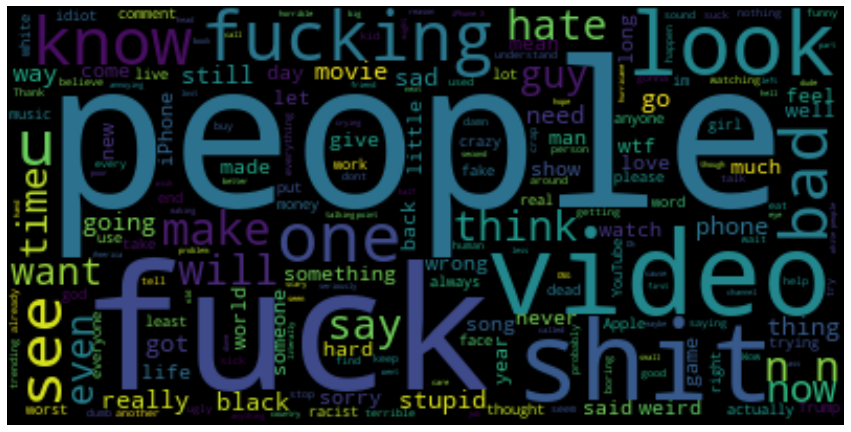

In [45]:
words = WordCloud(stopwords=set(STOPWORDS)).generate(negative_comments)
plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(words, interpolation='bilinear')
plt.show()

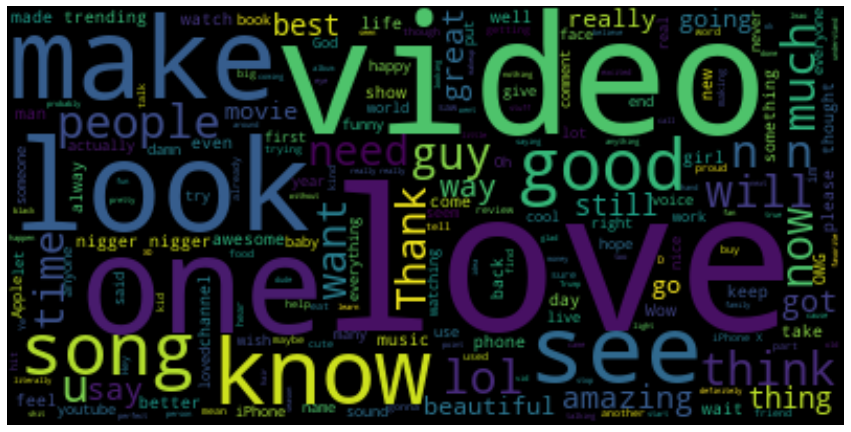

In [46]:
words = WordCloud(stopwords=set(STOPWORDS)).generate(positive_and_neutral)
plt.figure(figsize=(15,15))
plt.axis('off')
plt.imshow(words, interpolation='bilinear')
plt.show()

# Can we draw conclutions from emoji's ?

In [47]:
import emoji

In [48]:
emoji_list=[]
for comment in comments_data['comment_text']:
    for each_char in comment:
        if each_char in emoji.UNICODE_EMOJI_ENGLISH:
            emoji_list.append(each_char)

c:\users\rkuppi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: 'emoji.UNICODE_EMOJI_ENGLISH' is deprecated and will be removed in version 2.0.0. Use 'emoji.EMOJI_DATA' instead.
To hide this warning, pin/downgrade the package to 'emoji~=1.6.3'
  after removing the cwd from sys.path.


In [49]:
emoji_list[10:15]

['💙', '👍', '👈', '😂', '🔥']

In [50]:
len(emoji_list)

294549

In [51]:
from collections import Counter

In [52]:
Counter(emoji_list).most_common(10)

[('😂', 36987),
 ('😍', 33453),
 ('❤', 31119),
 ('🔥', 8694),
 ('😭', 8398),
 ('👏', 5719),
 ('😘', 5545),
 ('👍', 5476),
 ('💖', 5359),
 ('💕', 5147)]

In [53]:
emojis=[Counter(emoji_list).most_common(20)[i][0] for i in range(20)]

In [54]:
freqs=[Counter(emoji_list).most_common(20)[i][1] for i in range(20)]

In [55]:
import plotly.graph_objs as go

In [56]:
from plotly.offline import iplot

In [57]:
trace=go.Bar(x=emojis,y=freqs)

In [58]:
iplot([trace])

Which catatogory has maximum likes ?

In [59]:
full_data.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country,Category_name
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,CA,Comedy
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA,Comedy
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,CA,Entertainment
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,ð§: https://ad.gt/yt-perfect\nð°: https://...,CA,Music


In [60]:
full_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 375942 entries, 0 to 40948
Data columns (total 18 columns):
 #   Column                  Non-Null Count   Dtype 
---  ------                  --------------   ----- 
 0   video_id                375942 non-null  object
 1   trending_date           375942 non-null  object
 2   title                   375942 non-null  object
 3   channel_title           375942 non-null  object
 4   category_id             375942 non-null  int64 
 5   publish_time            375942 non-null  object
 6   tags                    375942 non-null  object
 7   views                   375942 non-null  int64 
 8   likes                   375942 non-null  int64 
 9   dislikes                375942 non-null  int64 
 10  comment_count           375942 non-null  int64 
 11  thumbnail_link          375942 non-null  object
 12  comments_disabled       375942 non-null  bool  
 13  ratings_disabled        375942 non-null  bool  
 14  video_error_or_removed  375942 non-nu

In [61]:
(full_data.groupby(by = 'title').sum()).reset_index().sort_values(by = "views", ascending=False)[0:10]

,title,category_id,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed
27330,Childish Gambino - This Is America (Official V...,920,11014979242,290396935,17571281,30373217,0,0,0
81184,Nicky Jam x J. Balvin - X (EQUIS) | Video Ofic...,430,8578023332,64436136,3048483,2403137,0,0,0
19941,Bad Bunny - Amorfoda | Video Oficial,460,7048799863,116054986,5540628,6751136,0,0,0
16636,Ariana Grande - No Tears Left To Cry,810,6153660785,182769459,6941697,15589716,0,0,0
118678,YouTube Rewind: The Shape of 2017 | #YouTubeRe...,1392,5606930213,141474753,71923276,42450281,0,0,0
105792,"Te Bote Remix - Casper, Nio GarcÃ­a, Darell, N...",350,5185429178,54753413,2836354,2048556,0,0,0
35955,Drake - Godâs Plan,540,5097369107,152643873,2709607,9899016,0,0,0
83763,Ozuna x Romeo Santos - El Farsante Remix,330,4495150978,38175496,3062839,1725929,0,0,0
19320,BTS (ë°©íìë ë¨) 'FAKE LOVE' Official MV,580,4449219508,279897557,8528976,59289892,0,0,0
20627,"Becky G, Natti Natasha - Sin Pijama (Official ...",550,4419572453,56448545,4744422,3440249,0,0,0


In [62]:
(full_data.groupby(by = 'title').sum()).reset_index().sort_values(by = "views", ascending=False)[0:10]

,title,category_id,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed
27330,Childish Gambino - This Is America (Official V...,920,11014979242,290396935,17571281,30373217,0,0,0
81184,Nicky Jam x J. Balvin - X (EQUIS) | Video Ofic...,430,8578023332,64436136,3048483,2403137,0,0,0
19941,Bad Bunny - Amorfoda | Video Oficial,460,7048799863,116054986,5540628,6751136,0,0,0
16636,Ariana Grande - No Tears Left To Cry,810,6153660785,182769459,6941697,15589716,0,0,0
118678,YouTube Rewind: The Shape of 2017 | #YouTubeRe...,1392,5606930213,141474753,71923276,42450281,0,0,0
105792,"Te Bote Remix - Casper, Nio GarcÃ­a, Darell, N...",350,5185429178,54753413,2836354,2048556,0,0,0
35955,Drake - Godâs Plan,540,5097369107,152643873,2709607,9899016,0,0,0
83763,Ozuna x Romeo Santos - El Farsante Remix,330,4495150978,38175496,3062839,1725929,0,0,0
19320,BTS (ë°©íìë ë¨) 'FAKE LOVE' Official MV,580,4449219508,279897557,8528976,59289892,0,0,0
20627,"Becky G, Natti Natasha - Sin Pijama (Official ...",550,4419572453,56448545,4744422,3440249,0,0,0


top 10 videos and their likes

In [64]:
import plotly.express as px

In [65]:
fig = px.bar(x='title',y='likes', data_frame = (full_data.groupby(by = 'title').sum()).reset_index().sort_values(by = "views", ascending=False)[0:10],
   title="Top 10 videos which have more likes",
    template='presentation')
fig.update_layout(xaxis={'visible': False, 'showticklabels': False})
fig.show()

Similarly we can plot disliked videos, most comment count videors 

In [66]:
full_data.groupby(by = 'Category_name').sum().reset_index().sort_values(by = 'likes', ascending=False)

,Category_name,category_id,views,likes,dislikes,comment_count,comments_disabled,ratings_disabled,video_error_or_removed
6,Music,425140,255967088943,7227198427,294657819,620030515,236,231,60
2,Entertainment,2616144,104517467253,2857743591,248270342,407583131,2612,1844,68
0,Comedy,620310,22050866339,1081392644,40698333,110064836,158,257,3
9,People & Blogs,1189144,23600365409,692550961,56634003,100889458,1090,1433,7
17,Film & Animation,20932,27619347901,589885590,25279207,65387125,536,519,85
13,Sports,402628,18972425164,399630743,26536025,46998109,513,448,5
4,Howto & Style,490256,9771031927,347338295,12756984,49180936,169,150,3
3,Gaming,229960,7730729502,298337663,19534374,48853951,208,130,2
11,Science & Technology,228788,9194715151,252570921,12218574,47344743,235,111,3
7,News & Politics,932200,10422502991,163503422,28778398,45391130,1921,1547,13


Catagory views and likes

In [67]:
fig = px.bar(x='Category_name',y=['likes','views', 'dislikes'], data_frame = full_data.groupby(by = 'Category_name').sum().reset_index().sort_values(by = 'likes', ascending=False),
   title="Catagory wise likes, views and dislikes", width=1000, height=500)
fig.show()

Will like rate dislike rate and comment rate increse when the views increases?

In [68]:
full_data['like_rate']=(full_data['likes']/full_data['views'])*100
full_data['dislike_rate']=(full_data['dislikes']/full_data['views'])*100
full_data['comment_count_rate']=(full_data['comment_count']/full_data['views'])*100

In [69]:
full_data

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,country,Category_name,like_rate,dislike_rate,comment_count_rate
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,...,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music,4.589104,0.253051,0.733639
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,...,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,CA,Comedy,12.594873,0.166363,1.284185
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,...,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA,Comedy,4.575843,0.167292,0.256342
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,...,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,CA,Entertainment,6.309630,0.094903,0.835851
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,...,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,ð§: https://ad.gt/yt-perfect\nð°: https://...,CA,Music,4.874563,0.062887,0.253752
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40944,BZt0qjTWNhw,18.14.06,The Cat Who Caught the Laser,AaronsAnimals,15,2018-05-18T13:00:04.000Z,"aarons animals|""aarons""|""animals""|""cat""|""cats""...",1685609,38160,1385,...,https://i.ytimg.com/vi/BZt0qjTWNhw/default.jpg,False,False,False,The Cat Who Caught the Laser - Aaron's Animals,US,Pets & Animals,2.263870,0.082166,0.157628
40945,1h7KV2sjUWY,18.14.06,True Facts : Ant Mutualism,zefrank1,22,2018-05-18T01:00:06.000Z,[none],1064798,60008,382,...,https://i.ytimg.com/vi/1h7KV2sjUWY/default.jpg,False,False,False,NaN,US,People & Blogs,5.635623,0.035875,0.369648
40946,D6Oy4LfoqsU,18.14.06,I GAVE SAFIYA NYGAARD A PERFECT HAIR MAKEOVER ...,Brad Mondo,24,2018-05-18T17:34:22.000Z,I gave safiya nygaard a perfect hair makeover ...,1066451,48068,1032,...,https://i.ytimg.com/vi/D6Oy4LfoqsU/default.jpg,False,False,False,I had so much fun transforming Safiyas hair in...,US,Entertainment,4.507286,0.096770,0.374326
40947,oV0zkMe1K8s,18.14.06,How Black Panther Should Have Ended,How It Should Have Ended,1,2018-05-17T17:00:04.000Z,"Black Panther|""HISHE""|""Marvel""|""Infinity War""|...",5660813,192957,2846,...,https://i.ytimg.com/vi/oV0zkMe1K8s/default.jpg,False,False,False,How Black Panther Should Have EndedWatch More ...,US,Film & Animation,3.408645,0.050275,0.231204


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17]),
 [Text(0, 0, ' Music'),
  Text(1, 0, ' Comedy'),
  Text(2, 0, ' Entertainment'),
  Text(3, 0, ' News & Politics'),
  Text(4, 0, ' People & Blogs'),
  Text(5, 0, ' Howto & Style'),
  Text(6, 0, 'Film & Animation'),
  Text(7, 0, ' Science & Technology'),
  Text(8, 0, ' Gaming'),
  Text(9, 0, ' Sports'),
  Text(10, 0, ' Nonprofits & Activism'),
  Text(11, 0, ' Pets & Animals'),
  Text(12, 0, ' Travel & Events'),
  Text(13, 0, 'Autos & Vehicles'),
  Text(14, 0, ' Education'),
  Text(15, 0, ' Shows'),
  Text(16, 0, ' Movies'),
  Text(17, 0, ' Trailers')])

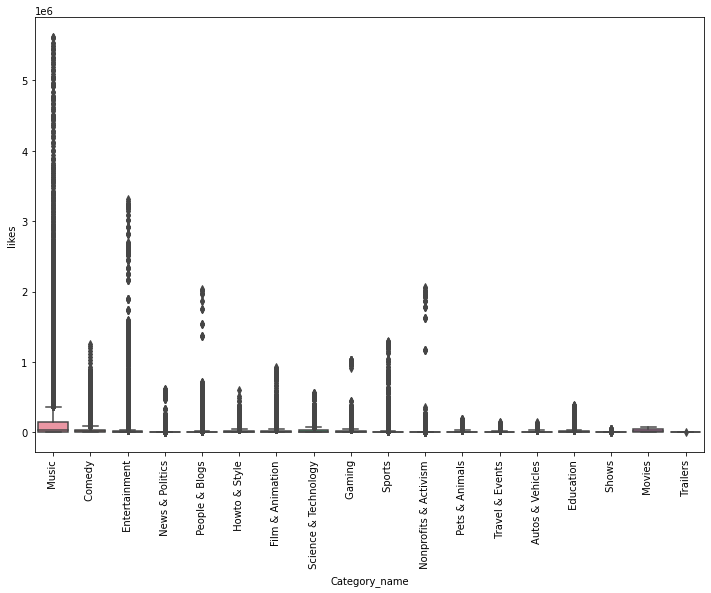

In [70]:
plt.figure(figsize=(12,8))
sns.boxplot(x='Category_name',y='likes',data=full_data)
plt.xticks(rotation='vertical')

### analysing relationship between views & likes

<AxesSubplot:xlabel='views', ylabel='likes'>

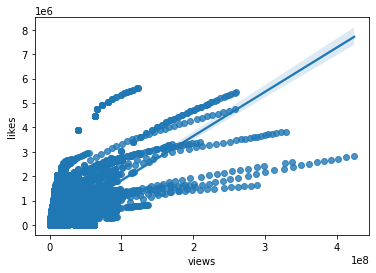

In [71]:
sns.regplot(data=full_data,x='views',y='likes')

In [72]:
### finding co-relation values between ['views', 'likes', 'dislikes']

<AxesSubplot:>

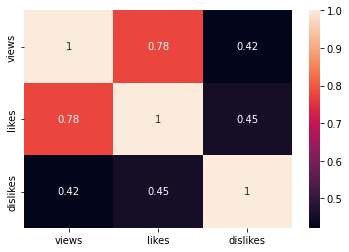

In [73]:
sns.heatmap(full_data[['views', 'likes', 'dislikes']].corr(),annot=True)

## channels with largest number of trending videos?

In [74]:
cdf=full_data.groupby('channel_title')['video_id'].count().sort_values(ascending=False).to_frame().reset_index().rename(columns={'video_id':'total_videos'})

In [75]:
import plotly.express as px

In [76]:
px.bar(data_frame=cdf[0:20],x='channel_title',y='total_videos')

## Inpact of emojis on likes, dislikes comments

In [77]:
import string

In [78]:
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [83]:
def punc_count(x):
    return len([c for c in x if c in string.punctuation])

In [80]:
full_data['title'][0]

0          Eminem - Walk On Water (Audio) ft. BeyoncÃ©
0    Sing zu Ende! | Gesangseinlagen vom Feinsten |...
0             Malika LePen : Femme de Gauche - Trailer
0        John Lewis Christmas Ad 2017 - #MozTheMonster
0    Sharry Mann: Cute Munda ( Song Teaser) | Parmi...
0    é¸èªããªãåç´ã«è½ä¸ï¼è·¯ä¸ã®è»ã...
0             ì¢ì by ë¯¼ì_ì¤ì¢
ì _ì¢ë ëµê°
0                       CapÃ­tulo 12 | MasterChef 2017
0    ÐÐ°Ñ
Ð°Ñ Ð¸ ÐÐ¾Ð»Ð¸Ð½Ð° ÑÑÐ°ÑÑÑ ÑÐºÐ¾...
0                   WE WANT TO TALK ABOUT OUR MARRIAGE
Name: title, dtype: object

In [81]:
sample=full_data[0:10000]

In [84]:
sample['count_punc']=sample['title'].apply(punc_count)

c:\users\rkuppi\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [85]:
sample.head()

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,...,comments_disabled,ratings_disabled,video_error_or_removed,description,country,Category_name,like_rate,dislike_rate,comment_count_rate,count_punc
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. BeyoncÃ©,EminemVEVO,10,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,...,False,False,False,Eminem's new track Walk on Water ft. BeyoncÃ© ...,CA,Music,4.589104,0.253051,0.733639,4
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,23,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,...,False,False,False,STill got a lot of packages. Probably will las...,CA,Comedy,12.594873,0.166363,1.284185,1
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,23,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,...,False,False,False,WATCH MY PREVIOUS VIDEO â¶ \n\nSUBSCRIBE âº ...,CA,Comedy,4.575843,0.167292,0.256342,3
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,24,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,...,False,False,False,I know it's been a while since we did this sho...,CA,Entertainment,6.309630,0.094903,0.835851,3
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,10,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,...,False,False,False,ð§: https://ad.gt/yt-perfect\nð°: https://...,CA,Music,4.874563,0.062887,0.253752,3


<AxesSubplot:xlabel='count_punc', ylabel='views'>

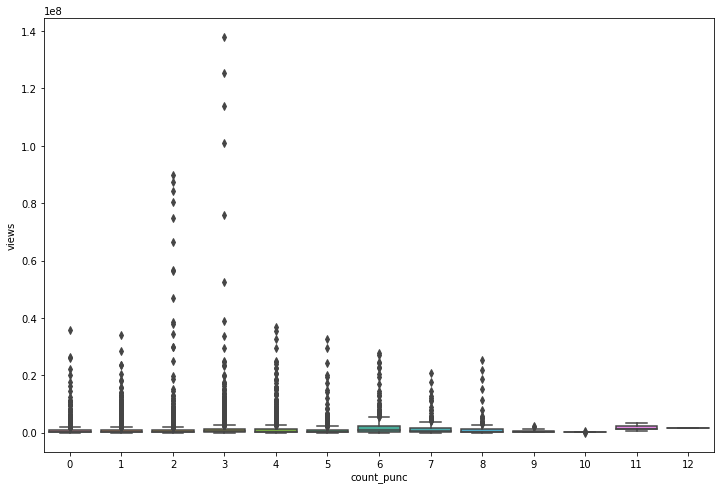

In [86]:
plt.figure(figsize=(12,8))
sns.boxplot(x='count_punc',y='views',data=sample)

In [87]:
sample['count_punc'].corr(sample['views'])

0.06510009783044858